In [1]:
# Need an older version of numba-cuda for the T4, restart after running this
!pip install numba-cuda==0.4.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 453.8/453.8 kB 11.5 MB/s eta 0:00:00
  Attempting uninstall: numba-cuda
    Found existing installation: numba-cuda 0.11.0
    Uninstalling numba-cuda-0.11.0:
      Successfully uninstalled numba-cuda-0.11.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 25.6.0 requires numba-cuda<0.12.0a0,>=0.11.0, but you have numba-cuda 0.4.0 which is incompatible.


# Utils

In [80]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage import gaussian_filter
from scipy.interpolate import griddata

In [81]:
def plot_ultra_smooth_surface(height_data, upscale_factor=2, cmap='Blues'):
    """
    Extra smooth version with interpolation upscaling
    """

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Create coordinate points from the original data
    x_orig = np.arange(height_data.shape[0])
    y_orig = np.arange(height_data.shape[1])
    X_orig, Y_orig = np.meshgrid(x_orig, y_orig, indexing='ij')

    # Flatten for interpolation
    points = np.column_stack((X_orig.ravel(), Y_orig.ravel()))
    values = height_data.ravel()

    # Create finer grid
    x_new = np.linspace(0, height_data.shape[0]-1, height_data.shape[0] * upscale_factor)
    y_new = np.linspace(0, height_data.shape[1]-1, height_data.shape[1] * upscale_factor)
    X_new, Y_new = np.meshgrid(x_new, y_new, indexing='ij')

    # Interpolate to higher resolution
    height_interp = griddata(points, values, (X_new, Y_new), method='cubic')

    # Handle any NaN values from interpolation
    height_interp = np.nan_to_num(height_interp, nan=0.0)

    # Apply additional smoothing
    height_smooth = gaussian_filter(height_interp, sigma=1.0)

    # Plot ultra-smooth surface
    surf = ax.plot_surface(X_new, Y_new, height_smooth,
                          cmap=cmap,
                          alpha=0.9,
                          edgecolor='none',
                          linewidth=0,
                          antialiased=True,
                          shade=True)  # Enable shading for depth

    # Clean styling
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Height')
    ax.set_title('Ultra-Smooth Wave Surface')
    ax.grid(False)

    # Remove background
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_alpha(0)
    ax.yaxis.pane.set_alpha(0)
    ax.zaxis.pane.set_alpha(0)

    plt.colorbar(surf, ax=ax, shrink=0.5)
    return fig, ax

# Initialize Waves

In [2]:
import numpy as np, matplotlib.pyplot as plt, math
from scipy.ndimage import convolve

In [3]:
board_size = (32, 32)

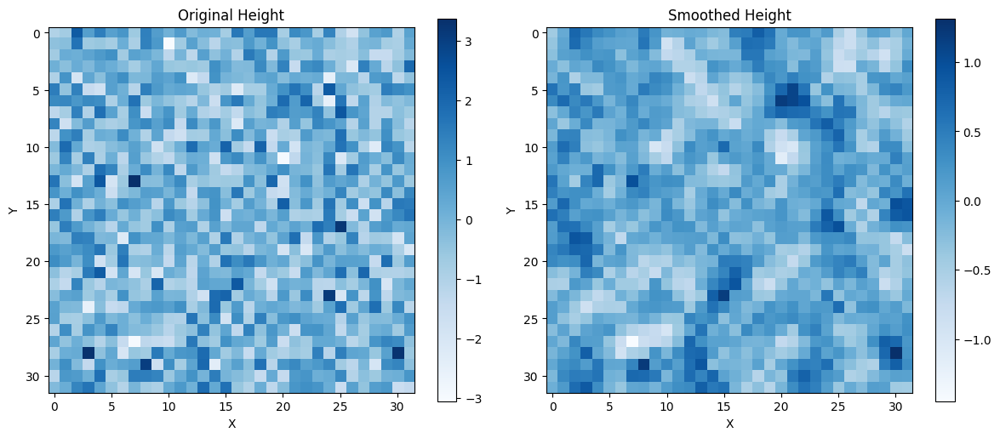

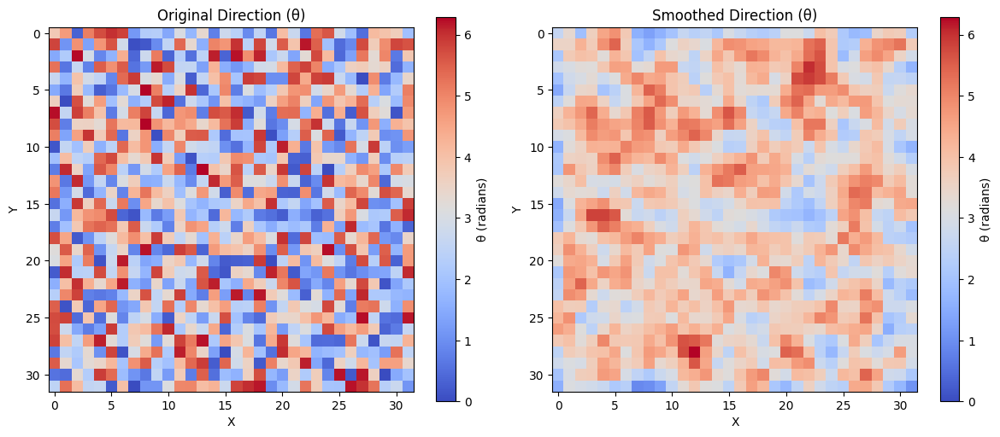

Original height range: [-3.053, 3.379]
Smoothed height range: [-1.449, 1.316]
Smoothing reduced variance from 0.992 to 0.155
Original direction range: [0.013, 6.274]
Smoothed direction range: [0.932, 6.283]
Direction smoothing reduced variance from 3.275 to 0.840


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
import math

# Get our waves initial height
init_height: np.ndarray = np.random.normal(size=board_size)
# Get their initial direction 0 to 2pi
init_direction: np.ndarray = np.random.uniform(low=0, high=2 * math.pi, size=board_size)

def smooth_randomness(x: np.ndarray, smoothness: float = 0.7) -> np.ndarray:
    # Note kernel is an overused word, this is a different kernel then a cuda kernel

    # Weight for targeted square
    cw: float = (1 - smoothness)
    # Weight for surrounding squares
    sw: float = smoothness / 8

    kernel = np.full((3, 3), fill_value=sw)

    kernel[1, 1] = cw

    # Basically a weighted average with the neighboring values
    return convolve(x, kernel, mode='constant', cval=0.0)

smoothed_height = smooth_randomness(init_height)
smoothed_direction = smooth_randomness(init_direction)
# Min max normailize directions to get back to [0, 2pi] range
smoothed_direction *= (2 * math.pi) / smoothed_direction.max()

# Claude generated plotting

# Create subplots to show both images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Show original height map
im1 = ax1.imshow(init_height, cmap='Blues')
ax1.set_title('Original Height')
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
plt.colorbar(im1, ax=ax1)

# Show smoothed height map
im2 = ax2.imshow(smoothed_height, cmap='Blues')
ax2.set_title('Smoothed Height')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
plt.colorbar(im2, ax=ax2)

plt.tight_layout()
plt.show()

# Create subplots to show direction images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Show original direction map
im1 = ax1.imshow(init_direction, cmap='coolwarm', vmin=0, vmax=2*math.pi)
ax1.set_title('Original Direction (θ)')
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
plt.colorbar(im1, ax=ax1, label='θ (radians)')

# Show smoothed direction map
im2 = ax2.imshow(smoothed_direction, cmap='coolwarm', vmin=0, vmax=2*math.pi)
ax2.set_title('Smoothed Direction (θ)')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
plt.colorbar(im2, ax=ax2, label='θ (radians)')

plt.tight_layout()
plt.show()

print(f"Original height range: [{init_height.min():.3f}, {init_height.max():.3f}]")
print(f"Smoothed height range: [{smoothed_height.min():.3f}, {smoothed_height.max():.3f}]")
print(f"Smoothing reduced variance from {init_height.var():.3f} to {smoothed_height.var():.3f}")

print(f"Original direction range: [{init_direction.min():.3f}, {init_direction.max():.3f}]")
print(f"Smoothed direction range: [{smoothed_direction.min():.3f}, {smoothed_direction.max():.3f}]")
print(f"Direction smoothing reduced variance from {init_direction.var():.3f} to {smoothed_direction.var():.3f}")

# Code for taking a step

In [5]:
from numba import cuda
from numba.types import float32, int32
from numba.cuda.cudadrv.devicearray import DeviceNDArray

from typing import List, Tuple
from dataclasses import dataclass
from math import prod

# Not sure what this does but it makes things not break do not touch this
from numba import config
config.CUDA_ENABLE_PYNVJITLINK = 1

In [6]:
def rad(angle: int) -> float:
    return 2 * math.pi * angle / 360

# Helper array we need to send to gpu
# Squares to check and add to from current square
other_squares = cuda.to_device(np.array([
    # (offset_x, offset_y, angle)
    # Front Left
    (-1, 1, rad(135)),
    # Front
    (0, 1, rad(90)),
    # Front Right
    (1, 1, rad(45)),
    # Right
    (1, 0, rad(0)),
    # Bottom Right
    (1, -1, rad(315)),
    # Bottom
    (0, -1, rad(270)),
    # Bottom Left
    (-1, -1, rad(225)),
    # Left
    (-1, 0, rad(180)),
], dtype=np.float32))

# We can return from device functions
# these can be called from the device, unlike device=False functions
@cuda.jit(device=True)
def calculate_influence(
    height: float32,
    direction: float32,  # In radians
    sq_angle: float32,
) -> float32:
    # Calculate angular difference, between 0, pi (with wrap around)
    angle_diff = abs(direction - sq_angle)

    # Handle wraparound
    if angle_diff > math.pi:
        angle_diff = 2 * math.pi - angle_diff

    # Weight height by how close angles are
    # When angles are identical (diff=0), weight = 0.5
    # When angles are opposite (diff=π), weight = -0.5
    return height * (0.5 - angle_diff / (math.pi))

@cuda.jit
def take_step(
    height,
    direction,
    influence_store,
    direction_store,
    other_squares,
    bound_x: int32,
    bound_y: int32,
    bound_z: int32,
) -> None:

    current_x, current_y = cuda.threadIdx.x, cuda.threadIdx.y
    current_z = cuda.blockIdx.x

    # Bounds check for current position
    if current_x >= bound_x or current_y >= bound_y or current_z >= bound_z:
        return

    # Load our variables
    current_height = height[current_x, current_y]
    current_direction = direction[current_x, current_y]

    # Access the GPU array instead of Python list
    offset_x = int(other_squares[current_z, 0])
    offset_y = int(other_squares[current_z, 1])
    influence_angle = other_squares[current_z, 2]

    # Calculate target coordinates
    influence_x = current_x + offset_x
    influence_y = current_y + offset_y

    # Bounds check for thing to influence
    if 0 <= influence_x < bound_x and 0 <= influence_y < bound_y:

        # Calculate new height
        influence_store[influence_x, influence_y, current_z] = calculate_influence(
            current_height, current_direction, influence_angle
        )

        # Find new direction for
        direction_store[influence_x, influence_y, current_z] = calculate_influence(
            current_direction, current_direction, influence_angle
        )

    else:
      # We hit a wall
      # Reverse direction from wall hit and keep height

      if influence_x < 0 or influence_x >= bound_x:
            # Hit vertical wall - reverse x component
            reflected_direction = math.pi - current_direction
      else:
          # Hit horizontal wall - reverse y component
          reflected_direction = 2 * math.pi - current_direction

      # Keep energy in current cell with reflected direction
      influence_store[current_x, current_y, 8] = calculate_influence(
            current_height, current_direction, influence_angle
        )
      direction_store[current_x, current_y, 8] = calculate_influence(
            reflected_direction, current_direction, influence_angle
        )


/usr/local/lib/python3.12/dist-packages/numba_cuda/numba/cuda/dispatcher.py:680: NumbaPerformanceWarning: Grid size 9 will likely result in GPU under-utilization due to low occupancy.
  warn(NumbaPerformanceWarning(msg))


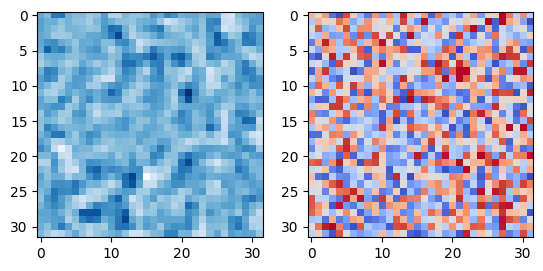

In [7]:
# Move data to gpu
height: DeviceNDArray = cuda.to_device(smoothed_height)
direction: DeviceNDArray = cuda.to_device(smoothed_direction)

# Make output arrays, add 8 on the end because each square has 8 neighbors and 1 self
out_size = (*height.shape, 9)
threads_per_block = height.shape

new_height: DeviceNDArray = cuda.to_device(np.zeros(out_size))
new_direction: DeviceNDArray = cuda.to_device(np.zeros(out_size))

nblocks = math.ceil(new_height.size / prod(threads_per_block))

# Run the function
take_step[nblocks, threads_per_block](height, direction, new_height, new_direction, other_squares, *out_size)

# Process output and plot
nh = np.sum(new_height.copy_to_host(), axis=-1)
nd = np.sum(new_direction.copy_to_host(), axis=-1) % 2 * math.pi # <-- make sure to clip

fig, ax = plt.subplots(1,2)

ax = ax.flatten()

ax[0].imshow(nh, cmap='Blues')
ax[1].imshow(nd, cmap='coolwarm')
plt.show()

# Running the simulation

In [8]:
import matplotlib.animation as animation
from IPython.display import HTML

In [9]:
frames: int = 500

In [36]:
# Copied from # Taking a step
# Move data to gpu
height: DeviceNDArray = cuda.to_device(smoothed_height)
direction: DeviceNDArray = cuda.to_device(smoothed_direction)

# Original energy, for normalizing waves
original_energy: float = smoothed_height.sum()

# Make output arrays, add 8 on the end because each square has 8 neighbors
out_size = (*height.shape, 9)
threads_per_block = height.shape

# Technically dont have to blank this every time as we override
new_height: DeviceNDArray = cuda.to_device(np.zeros(out_size))
new_direction: DeviceNDArray = cuda.to_device(np.zeros(out_size))

height_store = []
direction_store = []

for f in range(frames):

  # Part that happens on the gpu
  take_step[nblocks, threads_per_block](height, direction, new_height, new_direction, other_squares, *out_size)

  # The rest happens on the cpu
  calc_height = np.sum(new_height.copy_to_host(), axis=-1)

  # Normalize
  calc_height *= (original_energy / calc_height.sum())

  # Handle negative angles
  nd = new_direction.copy_to_host()
  nd[nd < 0] = 2 * math.pi - (np.abs(nd[nd < 0]) % 2 * math.pi)

  calc_direction = np.sum(nd, axis=-1) % 2 * math.pi

  height = cuda.to_device(calc_height)
  # Dont update?
  direction = cuda.to_device(calc_direction)

  height_store.append(calc_height)
  direction_store.append(calc_direction)

# Cast to np array as its more convenient
height_store = np.array(height_store)
direction_store_store = np.array(direction_store)

In [38]:
# Normalize with z score heights for plotting
norm_height_store = (
    height_store - height_store.mean(axis=(1, 2)).reshape((-1, 1, 1))) \
    / height_store.std(axis=(1, 2)).reshape((-1, 1, 1))


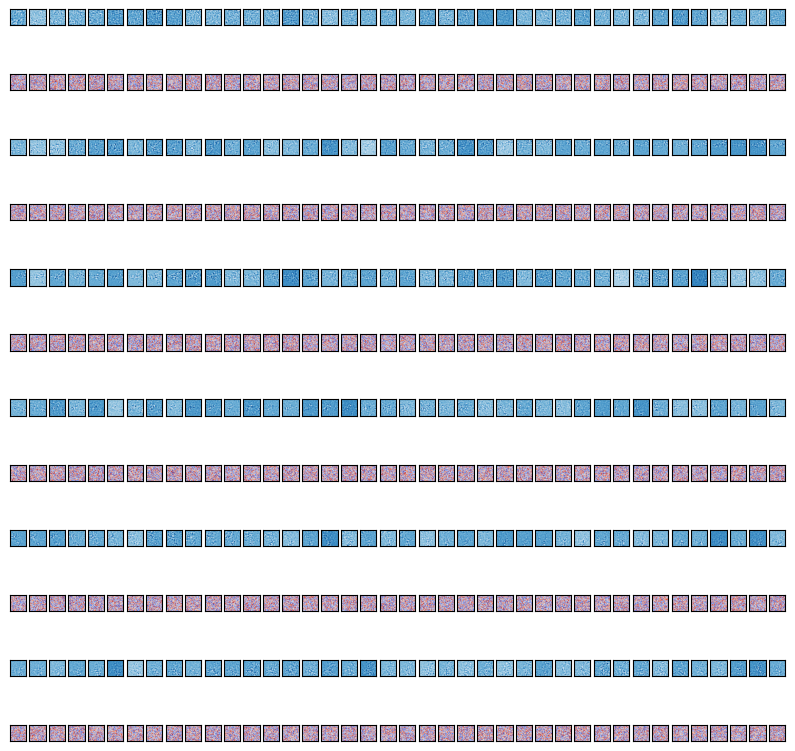

In [40]:
x, y = (12, 40)
start = 0

fig, ax = plt.subplots(x, y, figsize=(10, 10))

ax = ax.flatten()

for i in range(x * y // 2):

  h_coord = (i // y) * 2 * y + i % y
  d_coord = (i // y) * 2 * y + i % y + y

  ax[h_coord].imshow(norm_height_store[start + i], cmap='Blues')
  ax[d_coord].imshow(direction_store[start + i], cmap='coolwarm')

for a in ax:
    a.set_xticks([])
    a.set_yticks([])

plt.show()

Generating video...


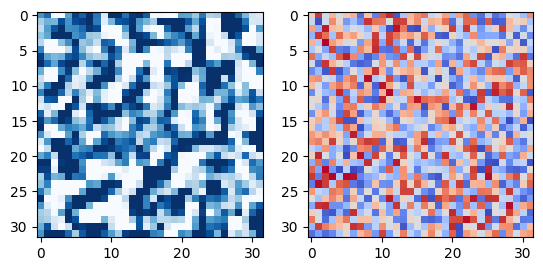

In [43]:
# Make into a video
fig, ax = plt.subplots(1, 2)

ax = ax.flatten()

h = ax[0].imshow(
    height_store[0],
    cmap='Blues',
  )
d = ax[1].imshow(direction_store[0], cmap='coolwarm')

def next_frame(frame: int) -> None:

  h.set_array(norm_height_store[frame])
  d.set_array(direction_store[frame])

  return (h, d)

ani = animation.FuncAnimation(fig=fig, func=next_frame, frames=frames, interval=15)

# This takes a while
print('Generating video...')
HTML(ani.to_html5_video())

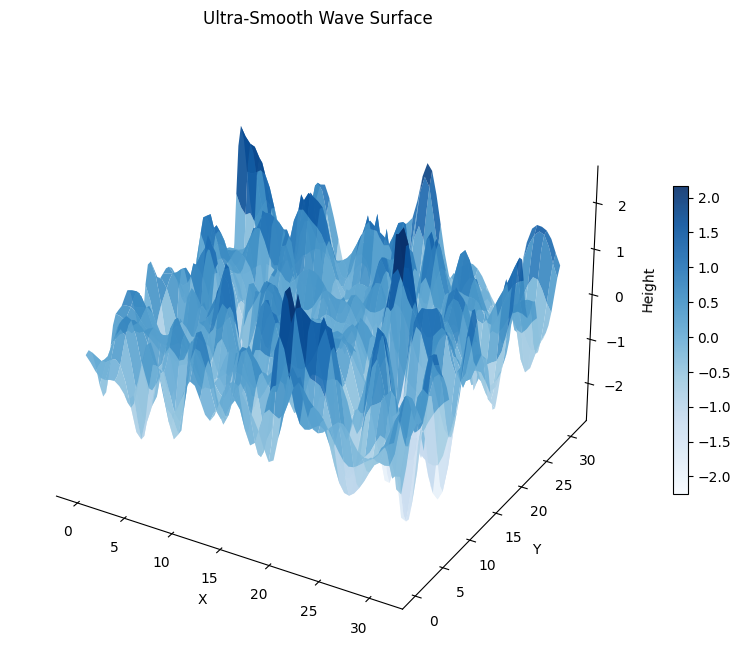

In [78]:
plot_ultra_smooth_surface(norm_height_store[0])
pass